# Import analysis functions from `core`

In [1]:
# from core.utils_data import getCleanGBMLGG
from core.utils_analysis_paper import *
from tqdm import tqdm

data/TCGA_GBMLGG/splits_original/gbmlgg15cv_all_st_patches_512_1_1_1.pkl
pathgraphomic_fusion
data/TCGA_GBMLGG/splits_original/gbmlgg15cv_all_st_patches_512_1_0_1_rnaseq.pkl
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
pathgraphomic_fusion
data/TCGA_GBMLGG/splits_original/gbmlgg15cv_all_st_patches_512_1_0_1_rnaseq.pkl
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5


# Glioma Grade Classification

In [2]:
models = [
    "omic",
    "omicomic_fusion",
    "graph",
    "graphgraph_fusion",
    "path",
    "pathpath_fusion",
    "pathomic_fusion",
    "graphomic_fusion",
    "pathgraphomic_fusion",
]
model_names = [
    "Genomic SNN",
    "Genomic (SNN + SNN)",
    "Histology GCN",
    "Histology (GCN + GCN)",
    "Histology CNN",
    "Histology (CNN + CNN)",
    "Pathomic F. (CNN+SNN)",
    "Pathomic F. (GCN+SNN)",
    "Pathomic F. (CNN+GCN+SNN)",
]

## Results that we reproduce

In [3]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/grad_15_paper/"
cv_grad_split = pd.DataFrame(
    np.array(
        [
            calcGradMetrics(
                *getPredAggGrad_GBMLGG(ckpt_name=ckpt_name, model=model, agg_type="max")
            )
            for model in tqdm(models)
        ]
    )
)
cv_grad_split.index = models
cv_grad_split.columns = ["Split %s" % str(k) for k in range(1, 16)]
cv_grad_split

100%|██████████| 9/9 [00:04<00:00,  1.91it/s]


,Split 1,Split 2,Split 3,Split 4,Split 5,Split 6,Split 7,Split 8,Split 9,Split 10,Split 11,Split 12,Split 13,Split 14,Split 15
omic,0.870921,0.818985,0.848255,0.859820,0.867791,0.852812,0.856891,0.835926,0.830391,0.814153,0.855710,0.861678,0.871914,0.838814,0.899139
omicomic_fusion,0.863815,0.831440,0.846147,0.854755,0.867243,0.855075,0.857862,0.835793,0.825713,0.816610,0.862101,0.858934,0.870859,0.837509,0.897598
graph,0.844480,0.859753,0.842613,0.873336,0.867929,0.830316,0.854511,0.833049,0.838466,0.844010,0.819497,0.847046,0.842341,0.833592,0.855835
graphgraph_fusion,0.851782,0.856159,0.843357,0.864469,0.893141,0.825350,0.857073,0.842533,0.857624,0.862938,0.827751,0.850611,0.821869,0.838269,0.850647
path,0.902380,0.909931,0.891252,0.931789,0.916680,0.876022,0.883728,0.867707,0.890789,0.887094,0.899645,0.879100,0.881330,0.871241,0.894379
pathpath_fusion,0.894553,0.894211,0.882293,0.912190,0.912318,0.875117,0.893691,0.866868,0.885916,0.878181,0.888639,0.883905,0.887094,0.875359,0.892807
pathomic_fusion,0.914879,0.883374,0.914874,0.931675,0.928916,0.894650,0.901636,0.872369,0.908499,0.882653,0.916228,0.908085,0.899581,0.900396,0.920303
graphomic_fusion,0.899555,0.864390,0.910828,0.922664,0.926091,0.879808,0.887571,0.869865,0.898864,0.886401,0.915503,0.913541,0.886495,0.878314,0.900787
pathgraphomic_fusion,0.914624,0.888724,0.905419,0.925103,0.909506,0.890041,0.905517,0.872423,0.912759,0.891345,0.927470,0.902830,0.899203,0.906393,0.909943


In [4]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/grad_15_paper/"
cv_grad = pd.DataFrame(
    np.array(
        [
            calcAggGradMetrics(*getPredAggGrad_GBMLGG(model=model, agg_type="max"))
            for model in tqdm(models)
        ]
    )
)
cv_grad.index = models
cv_grad.columns = ["AUC", "AP", "F1", "F1 Grade IV"]
cv_grad

100%|██████████| 9/9 [00:04<00:00,  1.89it/s]


,AUC,AP,F1,F1 Grade IV
omic,0.8522 ± 0.012,0.7287 ± 0.018,0.6503 ± 0.016,0.8541 ± 0.018
omicomic_fusion,0.8521 ± 0.011,0.7293 ± 0.018,0.6519 ± 0.015,0.8577 ± 0.015
graph,0.8458 ± 0.008,0.7584 ± 0.013,0.6482 ± 0.013,0.8100 ± 0.019
graphgraph_fusion,0.8496 ± 0.010,0.7625 ± 0.014,0.6617 ± 0.014,0.8287 ± 0.016
path,0.8922 ± 0.010,0.8122 ± 0.018,0.7141 ± 0.021,0.8836 ± 0.013
pathpath_fusion,0.8882 ± 0.007,0.8067 ± 0.013,0.7192 ± 0.020,0.8819 ± 0.014
pathomic_fusion,0.9052 ± 0.009,0.8341 ± 0.015,0.7254 ± 0.020,0.9066 ± 0.012
graphomic_fusion,0.8960 ± 0.011,0.8146 ± 0.019,0.7169 ± 0.020,0.9026 ± 0.016
pathgraphomic_fusion,0.9041 ± 0.008,0.8262 ± 0.014,0.7311 ± 0.018,0.9142 ± 0.010


## Results from the original paper

In [4]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/grad_15_paper/"
cv_grad = pd.DataFrame(
    np.array(
        [
            calcAggGradMetrics(
                *getPredAggGrad_GBMLGG(ckpt_name=ckpt_name, model=model, agg_type="max")
            )
            for model in tqdm(models)
        ]
    )
)
cv_grad.index = models
cv_grad.columns = ["AUC", "AP", "F1", "F1 Grade IV"]
cv_grad

100%|██████████| 9/9 [00:24<00:00,  2.76s/it]


,AUC,AP,F1,F1 Grade IV
omic,0.8529 ± 0.012,0.7294 ± 0.018,0.6518 ± 0.015,0.8567 ± 0.017
omicomic_fusion,0.8503 ± 0.012,0.7245 ± 0.019,0.6508 ± 0.018,0.8560 ± 0.017
graph,0.8493 ± 0.011,0.7635 ± 0.012,0.6651 ± 0.019,0.8493 ± 0.011
graphgraph_fusion,0.8512 ± 0.015,0.7625 ± 0.021,0.6502 ± 0.023,0.8124 ± 0.022
path,0.8826 ± 0.008,0.7930 ± 0.017,0.7166 ± 0.017,0.8732 ± 0.013
pathpath_fusion,0.8878 ± 0.007,0.8071 ± 0.013,0.7151 ± 0.021,0.8793 ± 0.015
pathomic_fusion,0.9049 ± 0.010,0.8326 ± 0.016,0.7299 ± 0.019,0.9125 ± 0.011
graphomic_fusion,0.8974 ± 0.010,0.8124 ± 0.016,0.7140 ± 0.018,0.9024 ± 0.014
pathgraphomic_fusion,0.9082 ± 0.008,0.8279 ± 0.016,0.7493 ± 0.020,0.9195 ± 0.014


## Make AUC curves for comparative analysis

Class: 0
	path - AUC: 0.859 ± 0.028
	omic - AUC: 0.841 ± 0.027
	pathgraphomic_fusion - AUC: 0.874 ± 0.022
Class: 1
	path - AUC: 0.806 ± 0.029
	omic - AUC: 0.677 ± 0.045
	pathgraphomic_fusion - AUC: 0.801 ± 0.029
Class: 2
	path - AUC: 0.960 ± 0.015
	omic - AUC: 0.921 ± 0.022
	pathgraphomic_fusion - AUC: 0.979 ± 0.010
Class: micro
	path - AUC: 0.892 ± 0.017
	omic - AUC: 0.852 ± 0.021
	pathgraphomic_fusion - AUC: 0.904 ± 0.014


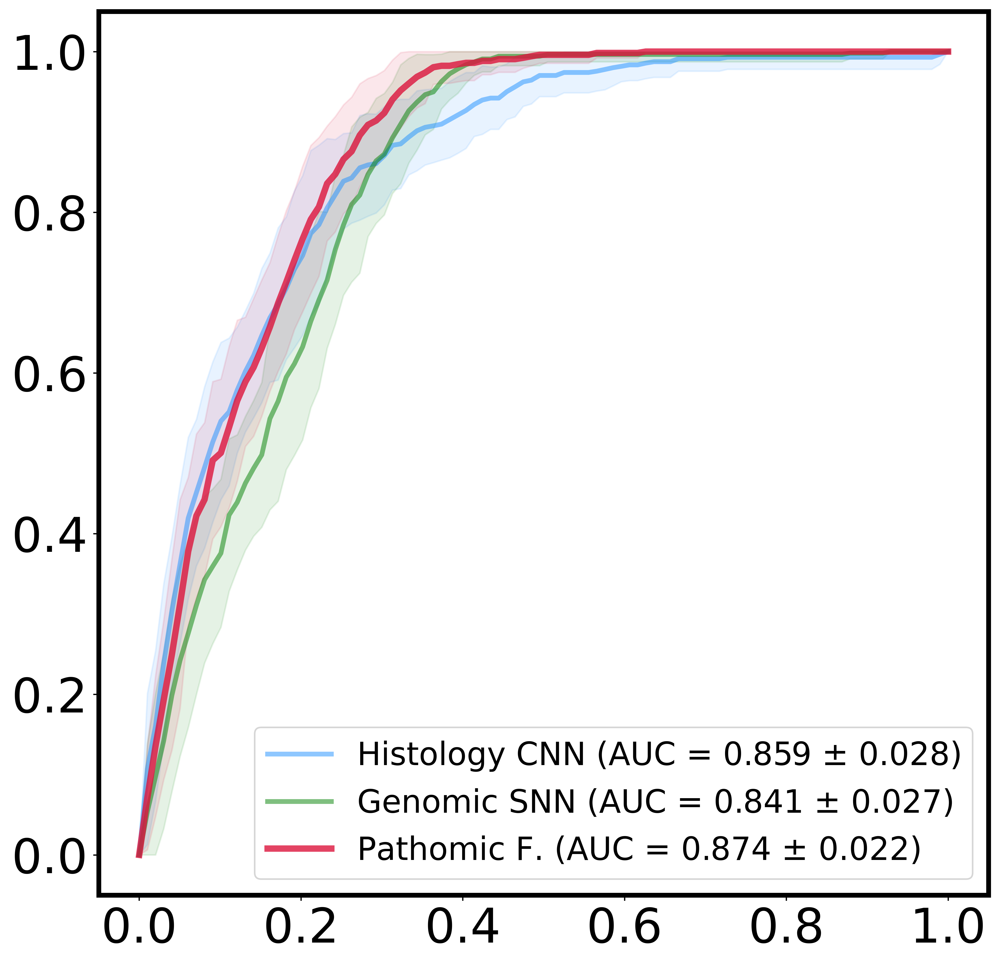

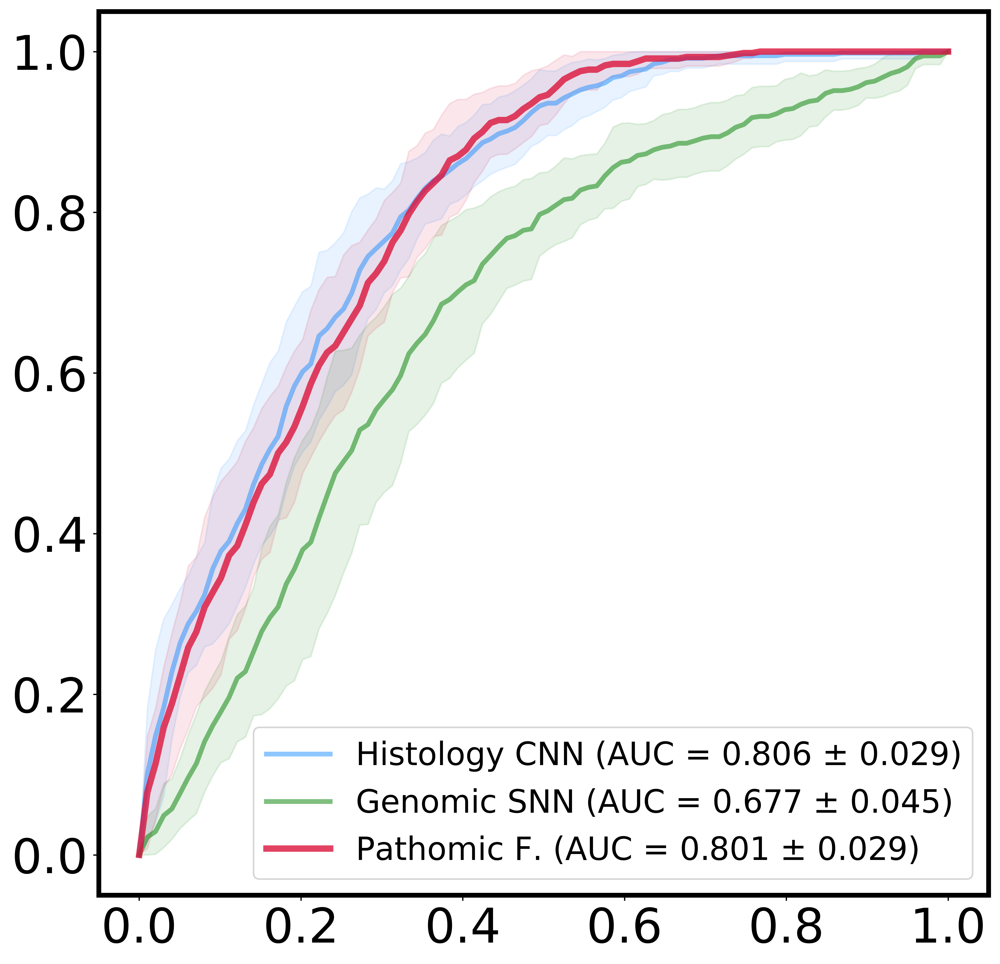

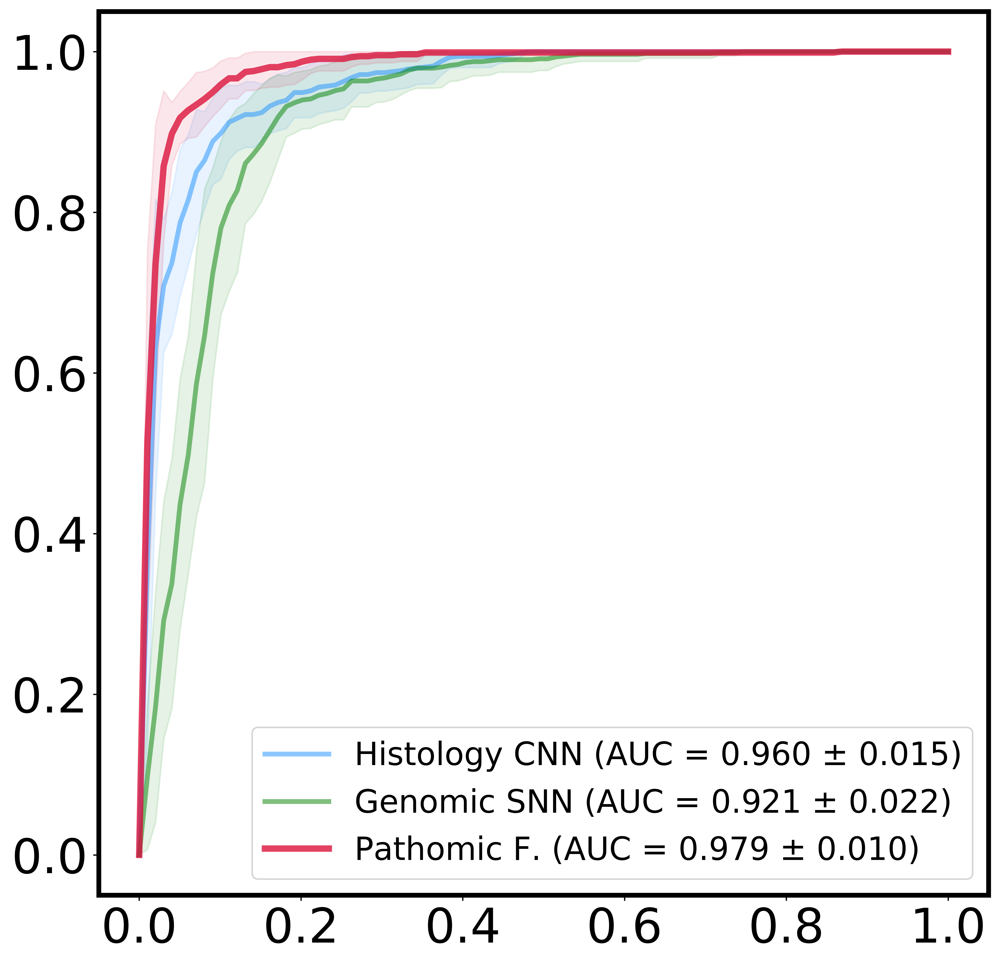

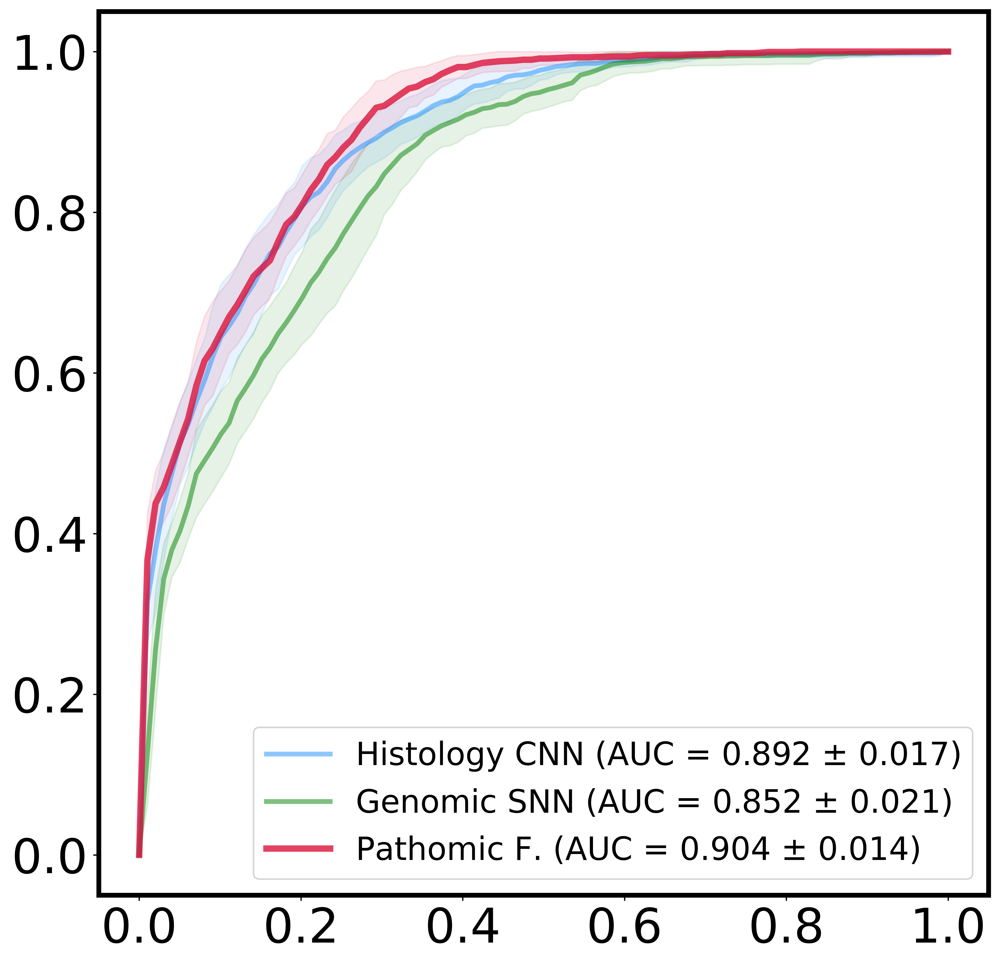

In [5]:
makeAUROCPlot(
    ckpt_name="./checkpoints/TCGA_GBMLGG/grad_15_paper/",
    model_list=["path", "omic", "pathgraphomic_fusion"],
    avg="micro",
)

Class: 0
	path - AUC: 0.859 ± 0.028
	omic - AUC: 0.841 ± 0.027
	pathgraphomic_fusion - AUC: 0.874 ± 0.022
Class: 1
	path - AUC: 0.806 ± 0.029
	omic - AUC: 0.677 ± 0.045
	pathgraphomic_fusion - AUC: 0.801 ± 0.029
Class: 2
	path - AUC: 0.960 ± 0.015
	omic - AUC: 0.921 ± 0.022
	pathgraphomic_fusion - AUC: 0.979 ± 0.010
Class: micro
	path - AUC: 0.892 ± 0.017
	omic - AUC: 0.852 ± 0.021
	pathgraphomic_fusion - AUC: 0.904 ± 0.014


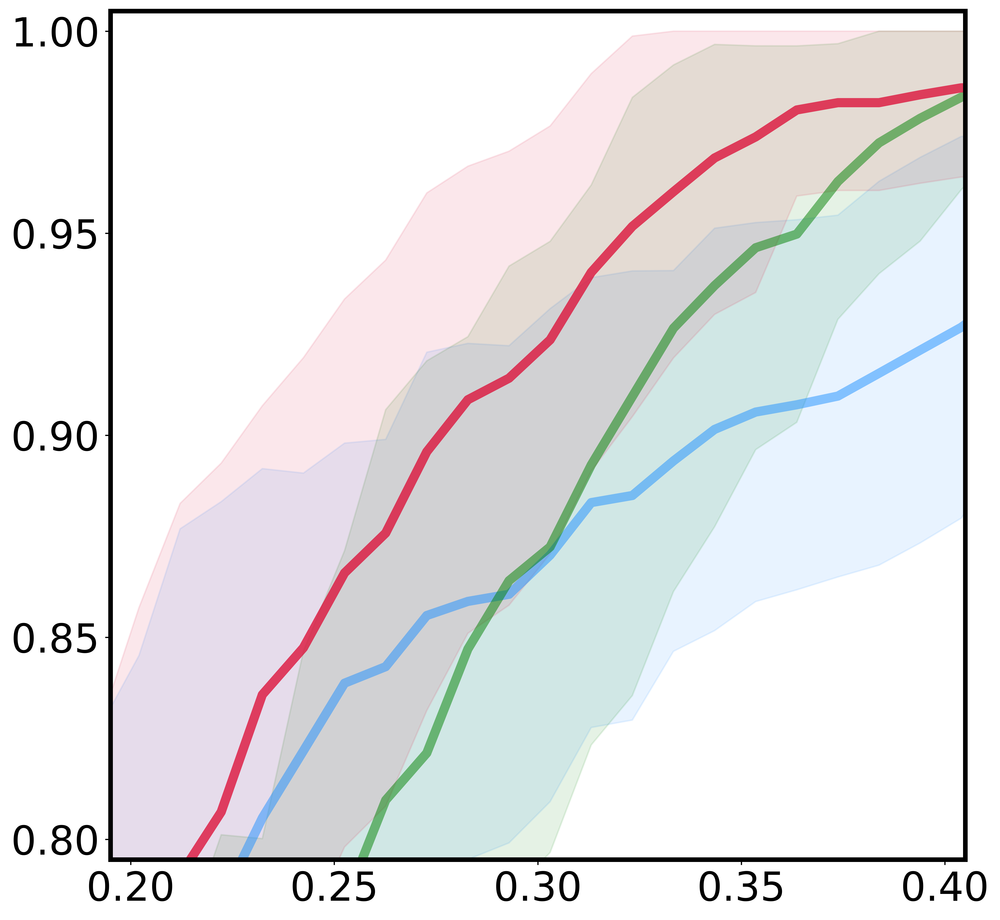

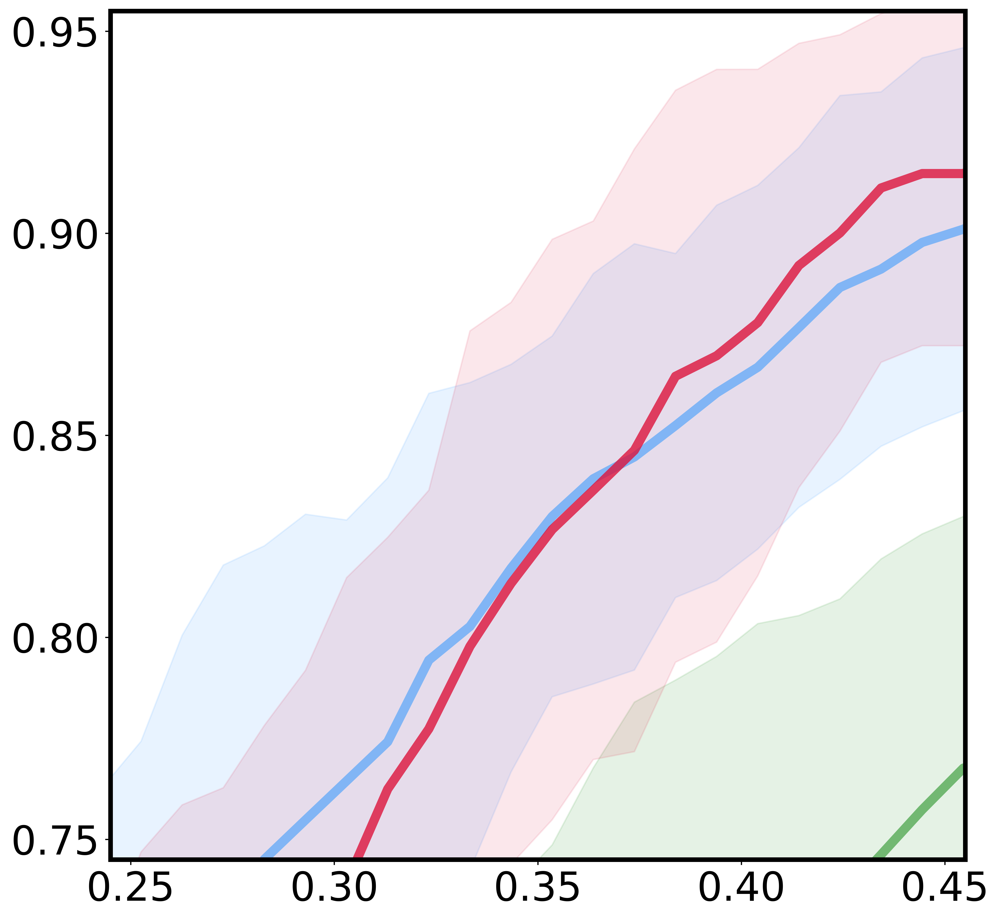

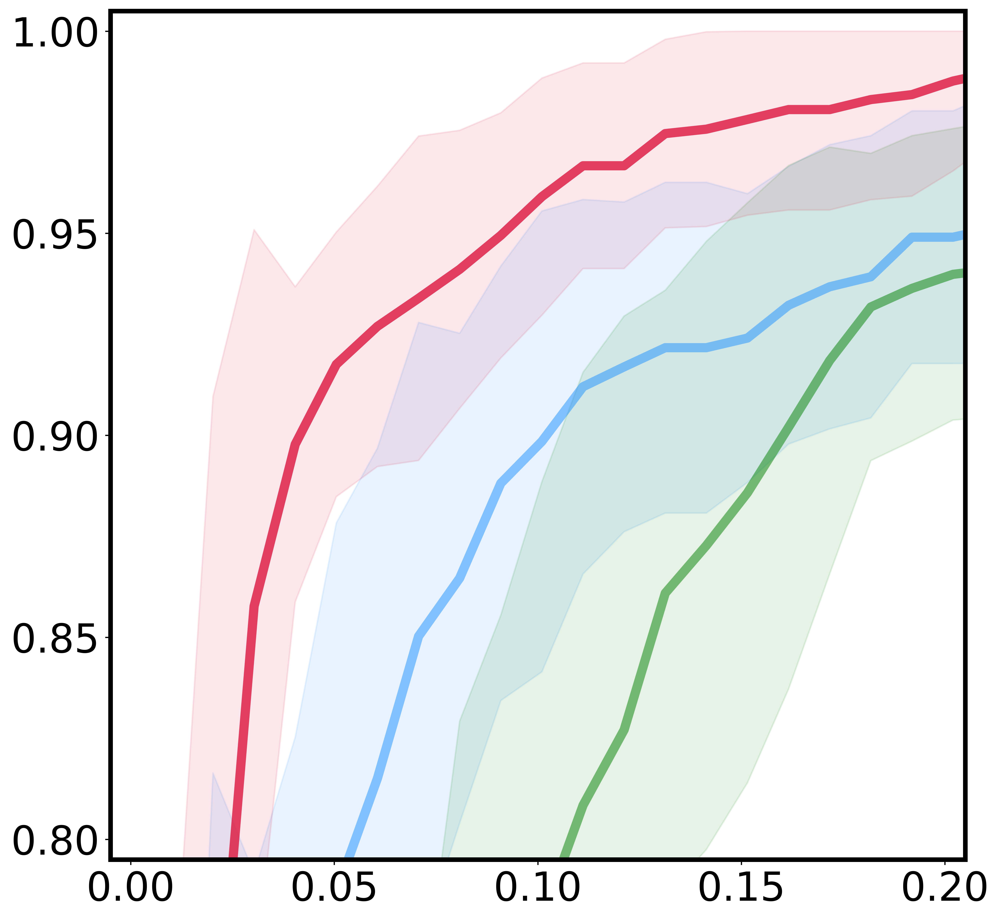

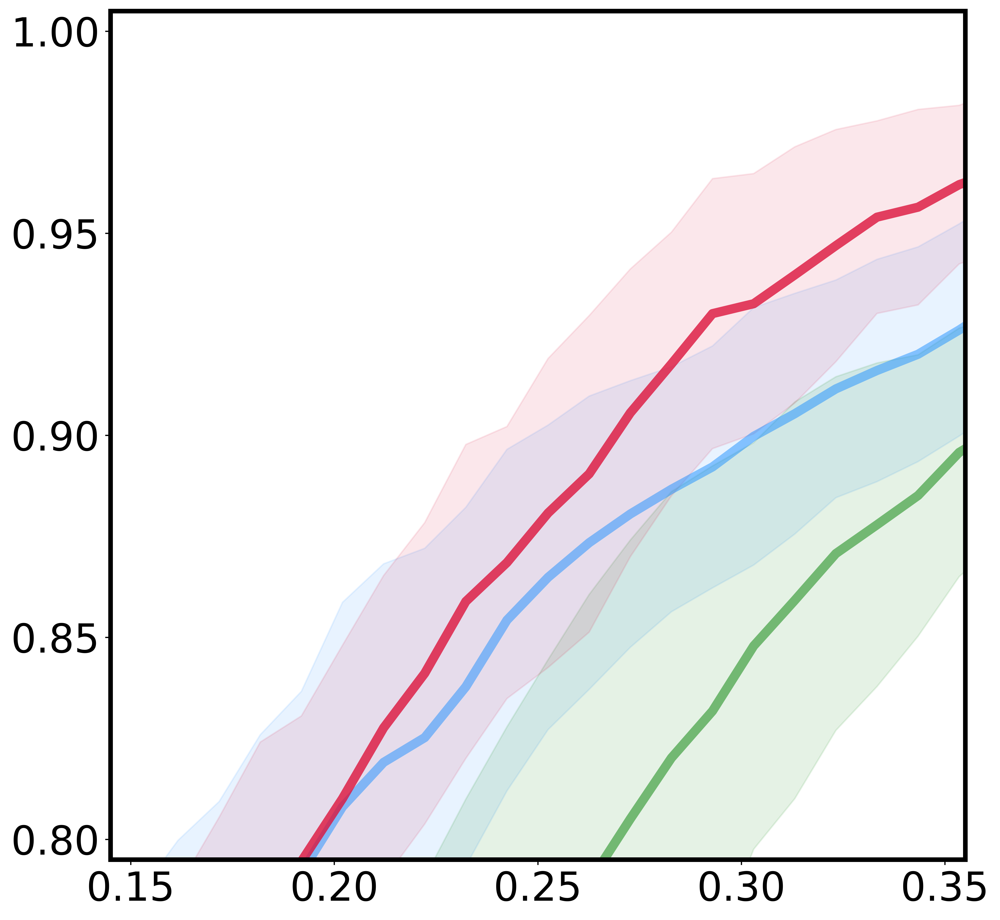

In [6]:
# we also plot the zoom-in version of the plot
makeAUROCPlot(
    ckpt_name="./checkpoints/TCGA_GBMLGG/grad_15_paper/",
    model_list=["path", "omic", "pathgraphomic_fusion"],
    avg="micro",
    use_zoom=True,
)

# Glioma Survival Outcome Prediction

### 1. Cox Baselines

In [6]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
trainCox_GBMLGG(ckpt_name=ckpt_name, model="cox_agegender", penalizer=0)

# Missing Molecular Subtype: 72
# Missing IDH Mutation: 72
# Missing 1p19q Codeletion: 72
# Missing Histological Subtype: 33
# Missing Grade: 33
C-Indices across Splits [0.7147273749297358, 0.7541977611940298, 0.7130471859010802, 0.7310171356704921, 0.7507861635220126, 0.7054662379421222, 0.7450995889977869, 0.7210217626176879, 0.7041129032258064, 0.7815342837746097, 0.7158008268919648, 0.7386735170481084, 0.7499293785310734, 0.725032637075718, 0.7236298932384342]
Average C-Index: 0.7316 ± 0.012


In [7]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
trainCox_GBMLGG(ckpt_name=ckpt_name, model="cox_moltype", penalizer=0)

# Missing Molecular Subtype: 72
# Missing IDH Mutation: 72
# Missing 1p19q Codeletion: 72
# Missing Histological Subtype: 33
# Missing Grade: 33
C-Indices across Splits [0.7472989195678271, 0.7591567291311755, 0.7115270350564468, 0.7548087085182836, 0.7435778108711839, 0.7573443008225617, 0.7743609456083029, 0.7667284522706209, 0.796311391889138, 0.7691740412979351, 0.7644585987261147, 0.7482376636455186, 0.7598806093042404, 0.7565323070690703, 0.7835834226509467]
Average C-Index: 0.7595 ± 0.011


In [8]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
trainCox_GBMLGG(ckpt_name=ckpt_name, model="cox_grade", penalizer=0)

# Missing Molecular Subtype: 72
# Missing IDH Mutation: 72
# Missing 1p19q Codeletion: 72
# Missing Histological Subtype: 33
# Missing Grade: 33
C-Indices across Splits [0.7134590995561192, 0.7231285988483686, 0.7055277859453102, 0.7338403041825095, 0.7070940170940171, 0.7394244105409153, 0.7776695877961701, 0.7350643008302132, 0.7878787878787878, 0.7458748327634904, 0.7300304298212248, 0.740462023101155, 0.7244370054777846, 0.7619384506544039, 0.7427146024707]
Average C-Index: 0.7379 ± 0.013


In [9]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
trainCox_GBMLGG(ckpt_name=ckpt_name, model="cox_molgrade", penalizer=0)

# Missing Molecular Subtype: 72
# Missing IDH Mutation: 72
# Missing 1p19q Codeletion: 72
# Missing Histological Subtype: 33
# Missing Grade: 33
C-Indices across Splits [0.7467735627688697, 0.7828759604829857, 0.7410034957844952, 0.7757697456492637, 0.7578443357783211, 0.7736149437486733, 0.8152903990517582, 0.7909964692036092, 0.8236830648672181, 0.7919983670136762, 0.7744778953078384, 0.7514867337602927, 0.7719534050179212, 0.7828816920026438, 0.7699017445357931]
Average C-Index: 0.7767 ± 0.013


### 2. Statistical Significance + Ensembling Effects in Pathomic Fusion

## we first make the analysis on some of the test results

In [1]:
models = [
    "path",
    "omic",
    "graph",
    "pathomic_fusion",
    "graphomic_fusion",
    "pathgraphomic_fusion",
]
model_names = [
    "Histology CNN",
    "Genomic SNN",
    "Histology GCN",
    "Pathomic F. (CNN+SNN)",
    "Pathomic F. (GCN+SNN)",
    "Pathomic F. (CNN+GCN+SNN)",
]

In [3]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
pvalue_surv_multi = [
    np.array(
        getPValAggSurv_GBMLGG_Multi(
            ckpt_name=ckpt_name, model=model, percentile=[33, 66]
        )
    )
    for model in tqdm(models)
]
pvalue_surv_multi = pd.DataFrame(np.array(pvalue_surv_multi))
pvalue_surv_binary = [
    np.array(
        getPValAggSurv_GBMLGG_Binary(ckpt_name=ckpt_name, model=model, percentile=[50])
    )
    for model in tqdm(models)
]
pvalue_surv_binary = pd.DataFrame(np.array(pvalue_surv_binary))
pvalue_surv = pd.concat([pvalue_surv_binary, pvalue_surv_multi], axis=1)
pvalue_surv.index = model_names
pvalue_surv.columns = [
    "P-Value (<50% vs. >50%)",
    "P-Value (<33% vs. 33-66%)",
    "P-Value (33-66% vs. >66%)",
]

cv_surv = [
    np.array(getPredAggSurv_GBMLGG(ckpt_name=ckpt_name, model=model))
    for model in tqdm(models)
]
cv_surv = pd.DataFrame(np.array(cv_surv))
cv_surv.columns = ["Split %s" % str(k) for k in range(1, 16)]
cv_surv.index = model_names
cv_surv["C-Index"] = [CI_pm(cv_surv.loc[model]) for model in model_names]
cv_surv_all = cv_surv[["C-Index"]].join(pvalue_surv, how="inner")

100%|██████████| 7/7 [00:00<00:00,  8.05it/s]


In [4]:
cv_surv

,Split 1,Split 2,Split 3,Split 4,Split 5,Split 6,Split 7,Split 8,Split 9,Split 10,Split 11,Split 12,Split 13,Split 14,Split 15,C-Index
Histology CNN,0.784998,0.796041,0.730159,0.801599,0.748368,0.721274,0.808305,0.784643,0.749564,0.814502,0.757848,0.779940,0.759320,0.721070,0.806758,0.7710 ± 0.018
Genomic SNN,0.785714,0.803239,0.772381,0.812863,0.792285,0.816837,0.809727,0.843336,0.814352,0.820242,0.823617,0.733533,0.765860,0.784662,0.856389,0.8023 ± 0.017
Histology GCN,0.792642,0.733053,0.676825,0.764535,0.747181,0.670080,0.774175,0.717564,0.778036,0.689426,0.731689,0.751497,0.767168,0.741266,0.746568,0.7388 ± 0.020
Pathomic F. (CNN+SNN),0.822504,0.816737,0.794921,0.827398,0.773294,0.814562,0.814846,0.836055,0.826264,0.839879,0.832586,0.826347,0.790713,0.836245,0.845037,0.8198 ± 0.011
Pathomic F. (GCN+SNN),0.816054,0.811938,0.786667,0.799055,0.782196,0.813709,0.814562,0.832745,0.841662,0.817523,0.816517,0.770210,0.798234,0.814683,0.855069,0.8114 ± 0.012
Pathomic F. (CNN+GCN+SNN),0.825370,0.830834,0.798730,0.812500,0.789614,0.826792,0.847270,0.846425,0.855026,0.842900,0.818386,0.819611,0.791367,0.839793,0.864308,0.8273 ± 0.013


In [5]:
cv_surv_all

,C-Index,P-Value (<50% vs. >50%),P-Value (<33% vs. 33-66%),P-Value (33-66% vs. >66%)
Histology CNN,0.7710 ± 0.018,1.479287e-37,0.000001,1.275895e-26
Genomic SNN,0.8023 ± 0.017,7.880654e-53,0.769360,1.372293e-83
Histology GCN,0.7388 ± 0.020,3.194850e-26,0.565802,4.368388e-26
Pathomic F. (CNN+SNN),0.8198 ± 0.011,1.130308e-55,0.095216,1.914901e-77
Pathomic F. (GCN+SNN),0.8114 ± 0.012,2.429412e-54,0.313099,3.392474e-76
Pathomic F. (CNN+GCN+SNN),0.8273 ± 0.013,5.983222e-59,0.089659,2.348627e-73


## We finally make analysis on the full test results

In [10]:
models = [
    "cox_agegender",
    "cox_moltype",
    "cox_grade",
    "cox_molgrade",
    "omic",
    "omicomic_fusion",
    "graph",
    "graphgraph_fusion",
    "path",
    "pathpath_fusion",
    "pathomic_fusion",
    "graphomic_fusion",
    "pathgraphomic_fusion",
]
model_names = [
    "Cox (Age+Gender)",
    "Cox (Subtype)",
    "Cox (Grade)",
    "Cox (Grade+Subtype)",
    "Genomic SNN",
    "Genomic (SNN + SNN)",
    "Histology GCN",
    "Histology (GCN + GCN)",
    "Histology CNN",
    "Histology (CNN + CNN)",
    "Pathomic F. (CNN+SNN)",
    "Pathomic F. (GCN+SNN)",
    "Pathomic F. (CNN+GCN+SNN)",
]

In [11]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
pvalue_surv_multi = [
    np.array(
        getPValAggSurv_GBMLGG_Multi(
            ckpt_name=ckpt_name, model=model, percentile=[33, 66]
        )
    )
    for model in tqdm(models)
]
pvalue_surv_multi = pd.DataFrame(np.array(pvalue_surv_multi))
pvalue_surv_binary = [
    np.array(
        getPValAggSurv_GBMLGG_Binary(ckpt_name=ckpt_name, model=model, percentile=[50])
    )
    for model in tqdm(models)
]
pvalue_surv_binary = pd.DataFrame(np.array(pvalue_surv_binary))
pvalue_surv = pd.concat([pvalue_surv_binary, pvalue_surv_multi], axis=1)
pvalue_surv.index = model_names
pvalue_surv.columns = [
    "P-Value (<50% vs. >50%)",
    "P-Value (<33% vs. 33-66%)",
    "P-Value (33-66% vs. >66%)",
]

cv_surv = [
    np.array(getPredAggSurv_GBMLGG(ckpt_name=ckpt_name, model=model))
    for model in tqdm(models)
]
cv_surv = pd.DataFrame(np.array(cv_surv))
cv_surv.columns = ["Split %s" % str(k) for k in range(1, 16)]
cv_surv.index = model_names
cv_surv["C-Index"] = [CI_pm(cv_surv.loc[model]) for model in model_names]
cv_surv_all = cv_surv[["C-Index"]].join(pvalue_surv, how="inner")

100%|██████████| 13/13 [00:00<00:00, 15.05it/s]


In [12]:
cv_surv

,Split 1,Split 2,Split 3,Split 4,Split 5,Split 6,Split 7,Split 8,Split 9,Split 10,Split 11,Split 12,Split 13,Split 14,Split 15,C-Index
Cox (Age+Gender),0.714727,0.754198,0.713047,0.731017,0.750786,0.705466,0.745100,0.721022,0.704113,0.781534,0.715801,0.738674,0.749929,0.725033,0.723630,0.7316 ± 0.012
Cox (Subtype),0.747299,0.759157,0.711527,0.754809,0.743578,0.757344,0.774361,0.766728,0.796311,0.769174,0.764459,0.748238,0.759881,0.756532,0.783583,0.7595 ± 0.011
Cox (Grade),0.713459,0.723129,0.705528,0.733840,0.707094,0.739424,0.777670,0.735064,0.787879,0.745875,0.730030,0.740462,0.724437,0.761938,0.742715,0.7379 ± 0.013
Cox (Grade+Subtype),0.746774,0.782876,0.741003,0.775770,0.757844,0.773615,0.815290,0.790996,0.823683,0.791998,0.774478,0.751487,0.771953,0.782882,0.769902,0.7767 ± 0.013
Genomic SNN,0.785714,0.803239,0.772381,0.812863,0.792285,0.816837,0.809727,0.843336,0.814352,0.820242,0.823617,0.733533,0.765860,0.784662,0.856389,0.8023 ± 0.017
Genomic (SNN + SNN),0.774247,0.784343,0.756508,0.788517,0.775668,0.803185,0.821388,0.821271,0.817257,0.785196,0.791480,0.766467,0.767495,0.800491,0.832629,0.7924 ± 0.013
Histology GCN,0.792642,0.733053,0.676825,0.764535,0.747181,0.670080,0.774175,0.717564,0.778036,0.689426,0.731689,0.751497,0.767168,0.741266,0.746568,0.7388 ± 0.020
Histology (GCN + GCN),0.773053,0.722855,0.694603,0.813590,0.766172,0.659841,0.779579,0.700574,0.787914,0.708761,0.767564,0.763473,0.706344,0.731441,0.684266,0.7373 ± 0.025
Histology CNN,0.784998,0.796041,0.730159,0.801599,0.748368,0.721274,0.808305,0.784643,0.749564,0.814502,0.757848,0.779940,0.759320,0.721070,0.806758,0.7710 ± 0.018
Histology (CNN + CNN),0.793598,0.804439,0.739683,0.818314,0.764392,0.778726,0.835609,0.809356,0.768158,0.791541,0.796712,0.824850,0.787443,0.772380,0.818374,0.7936 ± 0.014


In [13]:
cv_surv_all

,C-Index,P-Value (<50% vs. >50%),P-Value (<33% vs. 33-66%),P-Value (33-66% vs. >66%)
Cox (Age+Gender),0.7316 ± 0.012,1.900892e-92,1.475424e-38,5.927583e-27
Cox (Subtype),0.7595 ± 0.011,2.064634e-228,4.653368e-26,1.444895e-51
Cox (Grade),0.7379 ± 0.013,5.998349e-224,9.568192e-23,2.941556e-66
Cox (Grade+Subtype),0.7767 ± 0.013,5.291938e-215,1.140947e-40,5.016280e-52
Genomic SNN,0.8023 ± 0.017,7.880654e-53,7.693598e-01,1.372293e-83
Genomic (SNN + SNN),0.7924 ± 0.013,2.688850e-52,NaN,2.454380e-143
Histology GCN,0.7388 ± 0.020,3.194850e-26,5.658022e-01,4.368388e-26
Histology (GCN + GCN),0.7373 ± 0.025,2.646524e-29,2.554809e-02,8.050384e-21
Histology CNN,0.7710 ± 0.018,1.479287e-37,1.398231e-06,1.275895e-26
Histology (CNN + CNN),0.7936 ± 0.014,1.331124e-46,1.146139e-05,1.568596e-26


## Results below come from the original paper

In [26]:
cv_surv

,Split 1,Split 2,Split 3,Split 4,Split 5,Split 6,Split 7,Split 8,Split 9,Split 10,Split 11,Split 12,Split 13,Split 14,Split 15,C-Index
Cox (Age+Gender),0.714727,0.754198,0.713047,0.731017,0.750786,0.705466,0.745100,0.721022,0.704113,0.781534,0.715801,0.738674,0.749929,0.725033,0.723630,0.7316 ± 0.012
Cox (Subtype),0.747299,0.759157,0.711527,0.754809,0.743578,0.757344,0.774361,0.766728,0.796311,0.769174,0.764459,0.748238,0.759881,0.756532,0.783583,0.7595 ± 0.011
Cox (Grade),0.713459,0.723129,0.705528,0.733840,0.707094,0.739424,0.777670,0.735064,0.787879,0.745875,0.730030,0.740462,0.724437,0.761938,0.742715,0.7379 ± 0.013
Cox (Grade+Subtype),0.746774,0.782876,0.741003,0.775770,0.757844,0.773615,0.815290,0.790996,0.823683,0.791998,0.774478,0.751487,0.771953,0.782882,0.769902,0.7767 ± 0.013
Genomic SNN,0.801720,0.811038,0.779365,0.819041,0.791691,0.818544,0.804608,0.846867,0.817257,0.829305,0.829596,0.759356,0.768149,0.796670,0.848205,0.8081 ± 0.014
Genomic (SNN + SNN),0.769947,0.794541,0.765714,0.784520,0.778635,0.808020,0.803754,0.826346,0.808542,0.809063,0.801196,0.744386,0.776978,0.804312,0.839757,0.7944 ± 0.014
Histology GCN,0.781653,0.797241,0.689524,0.787791,0.715134,0.689420,0.811718,0.742718,0.780941,0.709366,0.723468,0.757485,0.741007,0.717795,0.751320,0.7464 ± 0.022
Histology (GCN + GCN),0.780698,0.795441,0.687619,0.784157,0.715727,0.688851,0.810011,0.738747,0.777455,0.709366,0.728700,0.744760,0.742315,0.716157,0.750792,0.7447 ± 0.021
Histology CNN,0.790253,0.802040,0.741587,0.815407,0.762611,0.778157,0.827076,0.801412,0.775712,0.781873,0.809417,0.831587,0.781557,0.775109,0.808342,0.7921 ± 0.014
Histology (CNN + CNN),0.794553,0.803239,0.739683,0.816860,0.763798,0.778726,0.835040,0.810680,0.768158,0.791541,0.797459,0.825599,0.787443,0.771834,0.817846,0.7935 ± 0.014


In [27]:
cv_surv_all

,C-Index,P-Value (<50% vs. >50%),P-Value (<33% vs. 33-66%),P-Value (33-66% vs. >66%)
Cox (Age+Gender),0.7316 ± 0.012,1.900892e-92,1.475424e-38,5.927583e-27
Cox (Subtype),0.7595 ± 0.011,2.064634e-228,4.653368e-26,1.444895e-51
Cox (Grade),0.7379 ± 0.013,5.998349e-224,9.568192e-23,2.941556e-66
Cox (Grade+Subtype),0.7767 ± 0.013,5.291938e-215,1.140947e-40,5.016280e-52
Genomic SNN,0.8081 ± 0.014,1.519321e-52,1.531065e-01,2.164183e-81
Genomic (SNN + SNN),0.7944 ± 0.014,5.090139e-54,NaN,1.641976e-138
Histology GCN,0.7464 ± 0.022,1.618834e-21,2.288528e-03,4.202852e-15
Histology (GCN + GCN),0.7447 ± 0.021,5.620511e-10,8.043318e-02,9.135586e-10
Histology CNN,0.7921 ± 0.014,5.092422e-40,1.774952e-07,6.604784e-25
Histology (CNN + CNN),0.7935 ± 0.014,1.370966e-44,1.966565e-06,4.653116e-26


### 3. Plots used for our report

## results that we reproduce

,Grade II (%),Grade III (%),Grade IV (%),ODG (%),IDHmut ATC (%),IDHwt ATC (%)
Density Region,,,,,,
-1.00 < Hazard < -0.50,49.17,36.21,3.32,20.60,20.27,6.31
0.00 < Hazard < 0.75,32.72,58.09,3.31,19.12,22.43,22.06
1.00 < Hazard < 1.50,8.16,30.10,60.20,9.69,12.24,69.90
-1.00 < Hazard < 0.00,45.85,42.33,2.56,21.25,20.77,12.30
0.00 < Hazard < 1.00,18.79,56.05,15.61,18.79,19.75,28.34
1.00 < Hazard < 1.50,11.11,31.37,53.59,6.54,13.73,60.78
-1.00 < Hazard < -0.50,47.32,39.48,1.31,25.56,23.54,1.07
1.00 < Hazard < 1.25,17.04,42.15,40.36,4.48,12.11,64.13
1.25 < Hazard < 1.50,12.96,40.20,45.85,4.65,7.64,70.76


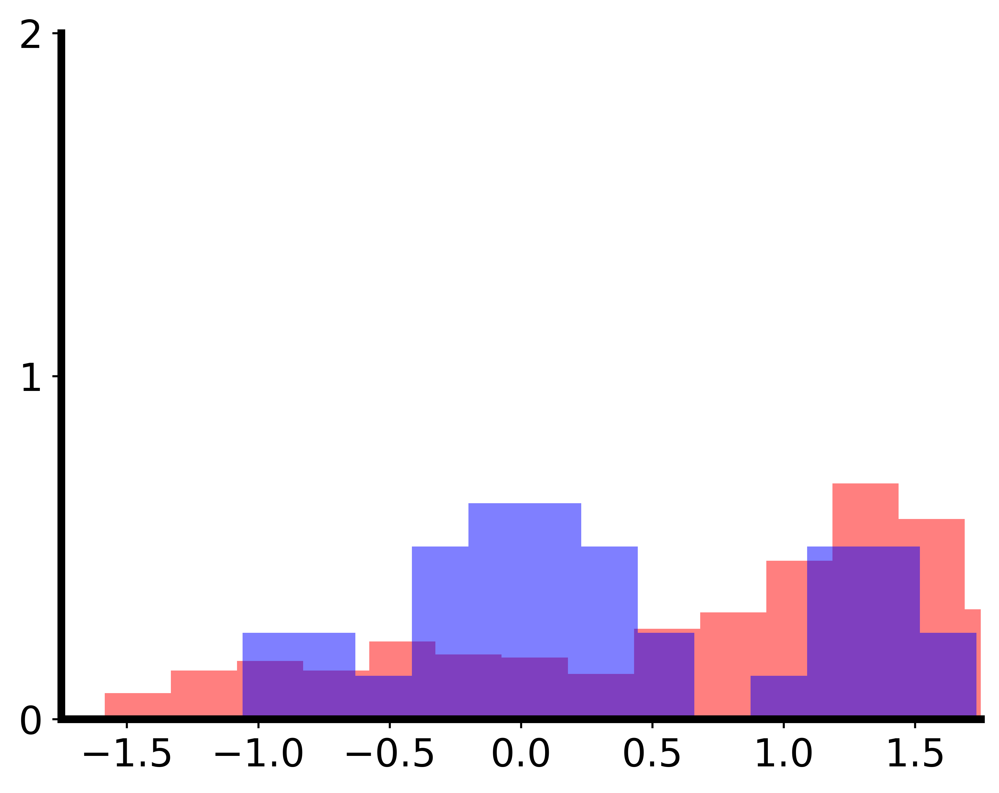

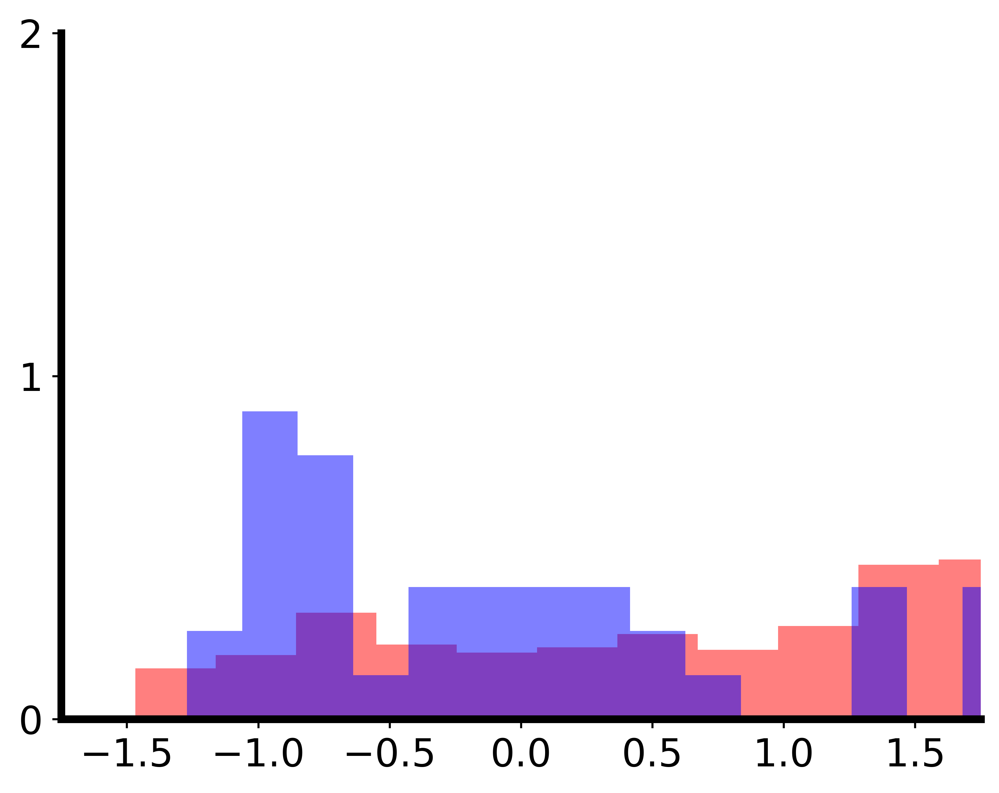

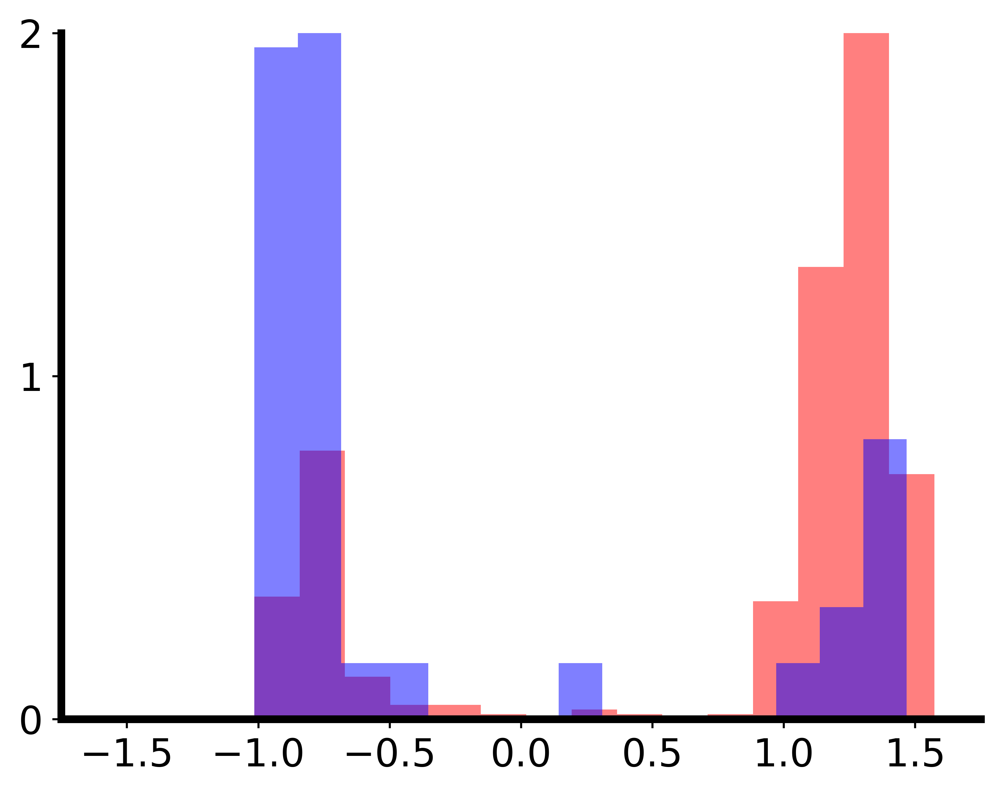

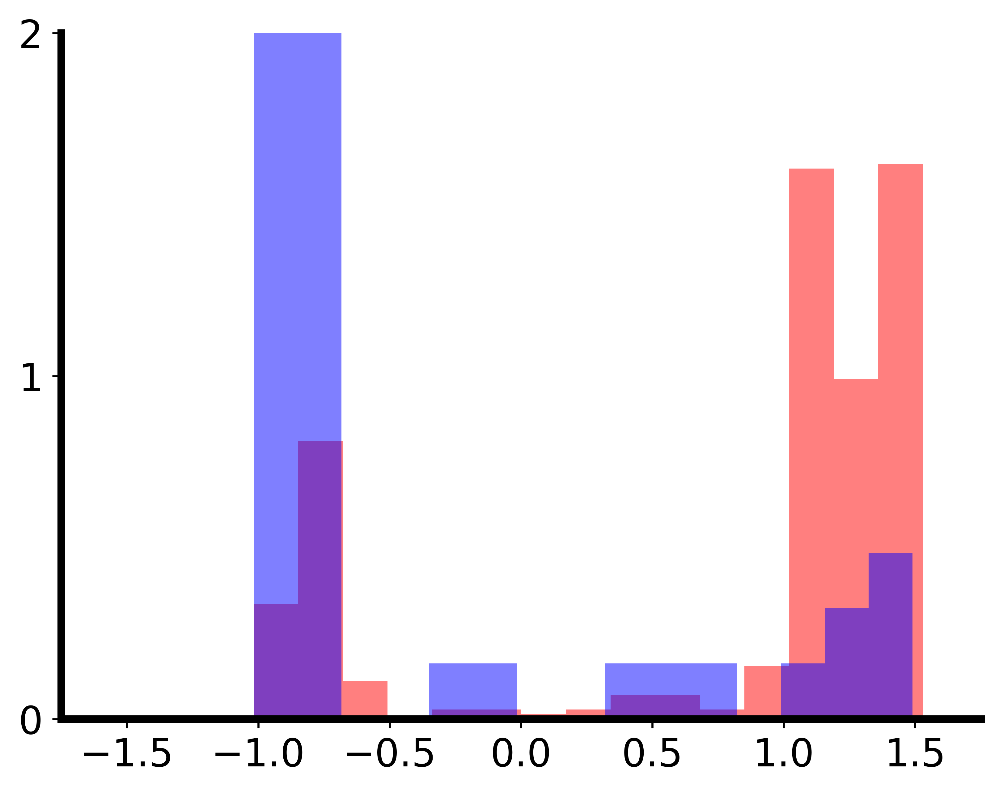

In [14]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
cluster_p = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name, model="path", c=[(-1.0, -0.5), (0, 0.75), (1, 1.5)]
)
cluster_g = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name, model="graph", c=[(-1.0, 0.0), (0.0, 1.0), (1, 1.5)]
)
cluster_o = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name, model="omic", c=[(-1.0, -0.5), (1, 1.25), (1.25, 1.5)]
)
cluster_pgo = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name,
    model="pathgraphomic_fusion",
    c=[(-1.0, -0.5), (1, 1.25), (1.25, 1.5)],
)
cluster_results = pd.concat([cluster_p, cluster_g, cluster_o, cluster_pgo])
cluster_results

## Results below comes from the original paper

,Grade II (%),Grade III (%),Grade IV (%),ODG (%),IDHmut ATC (%),IDHwt ATC (%)
Density Region,,,,,,
-1.00 < Hazard < -0.50,53.22,33.90,1.36,17.63,20.00,4.07
0.00 < Hazard < 0.75,29.03,60.22,6.09,23.30,21.51,20.43
1.00 < Hazard < 1.50,7.65,29.51,62.84,7.10,13.66,72.68
-1.00 < Hazard < 0.00,43.57,44.91,3.45,18.81,21.69,15.16
0.00 < Hazard < 1.00,26.69,51.40,11.80,21.35,18.54,24.44
1.00 < Hazard < 1.50,9.39,36.46,50.83,11.05,11.05,60.22
-1.00 < Hazard < -0.50,47.83,39.28,1.61,25.77,23.54,1.12
1.00 < Hazard < 1.25,15.42,43.17,40.97,4.85,12.78,63.88
1.25 < Hazard < 1.50,12.88,40.15,45.45,4.17,7.20,71.59


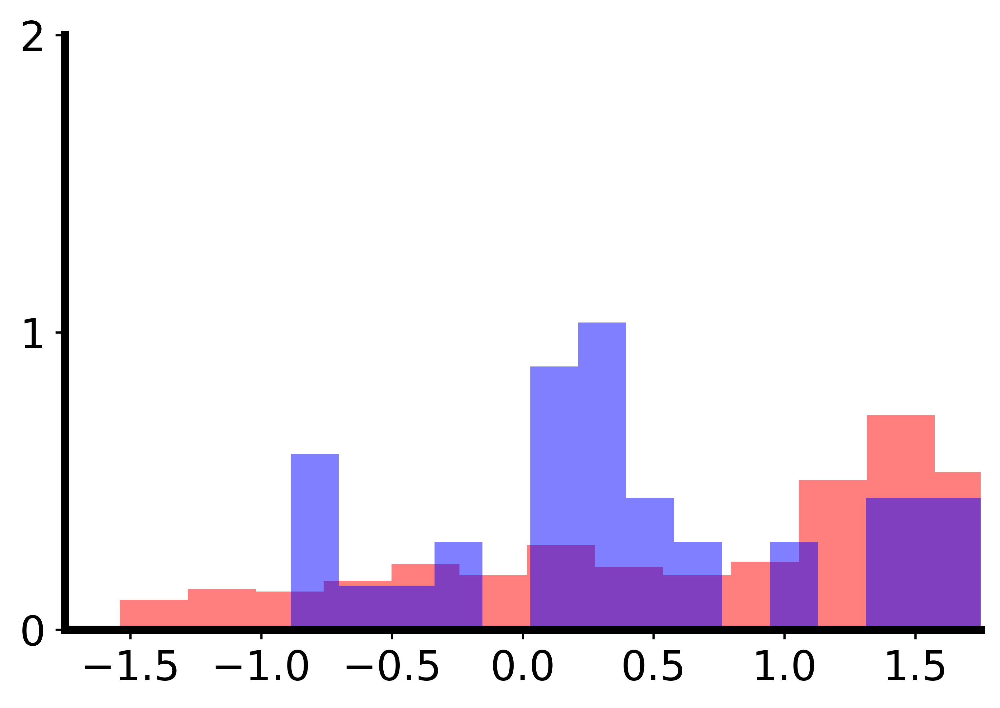

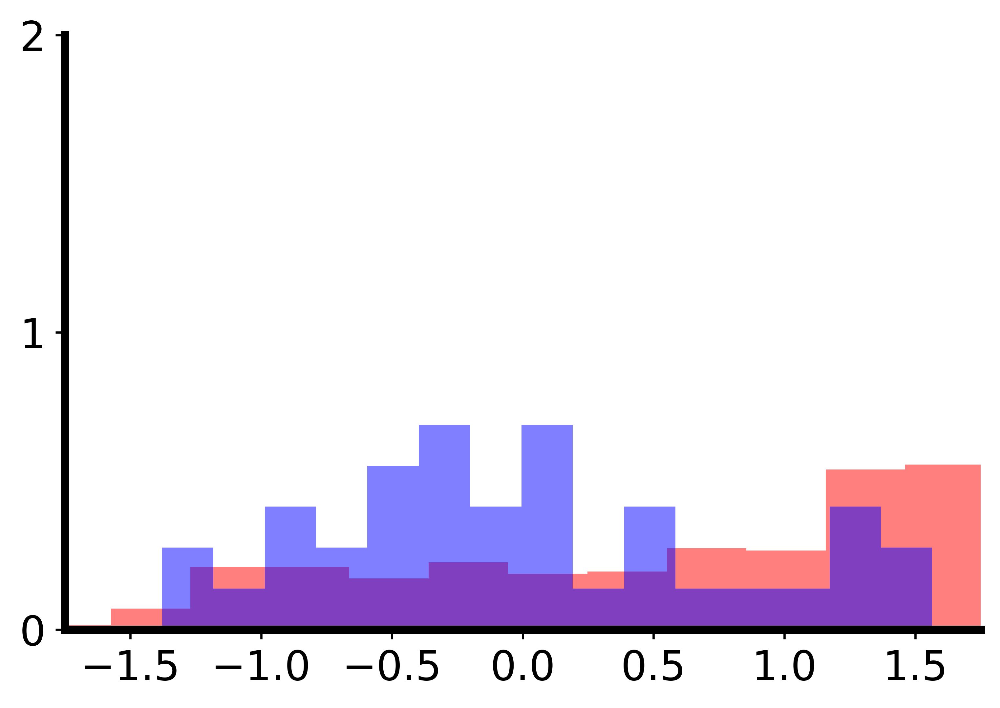

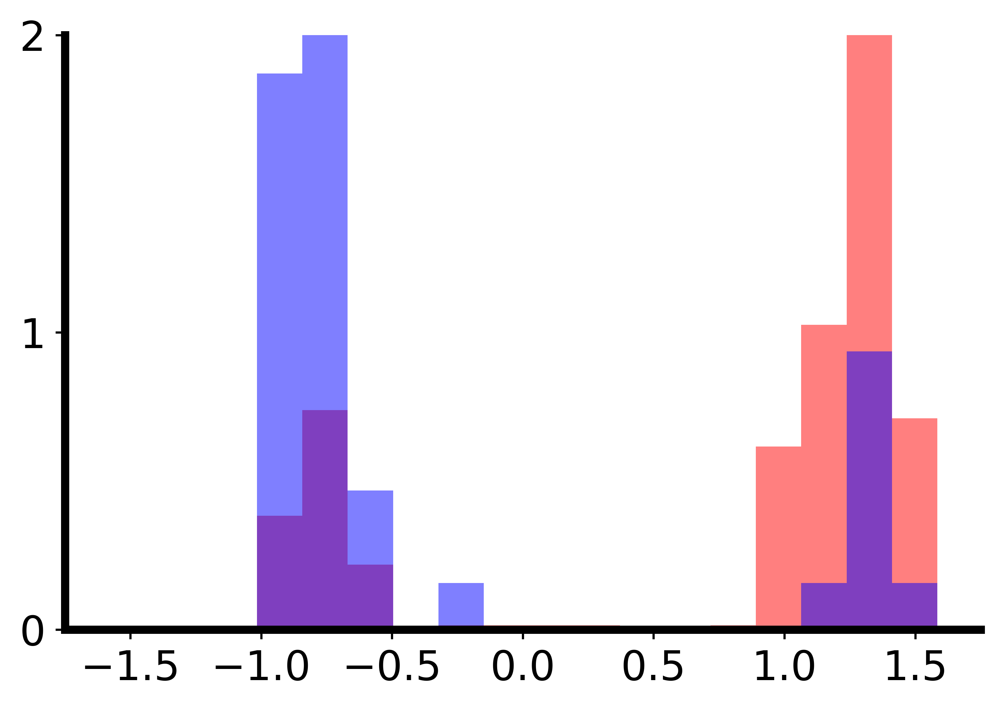

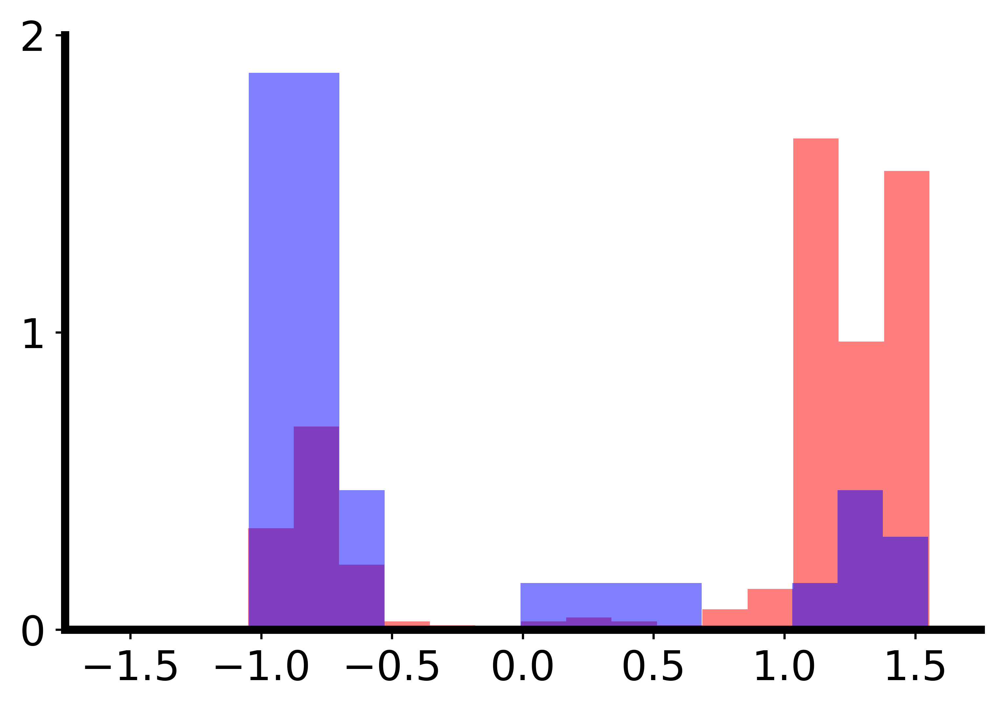

In [58]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
cluster_p = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name, model="path", c=[(-1.0, -0.5), (0, 0.75), (1, 1.5)]
)
cluster_g = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name, model="graph", c=[(-1.0, 0.0), (0.0, 1.0), (1, 1.5)]
)
cluster_o = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name, model="omic", c=[(-1.0, -0.5), (1, 1.25), (1.25, 1.5)]
)
cluster_pgo = getHazardHistogramPlot_GBMLGG(
    ckpt_name=ckpt_name,
    model="pathgraphomic_fusion",
    c=[(-1.0, -0.5), (1, 1.25), (1.25, 1.5)],
)
cluster_results = pd.concat([cluster_p, cluster_g, cluster_o, cluster_pgo])
cluster_results

  0%|          | 0/4 [00:00<?, ?it/s]

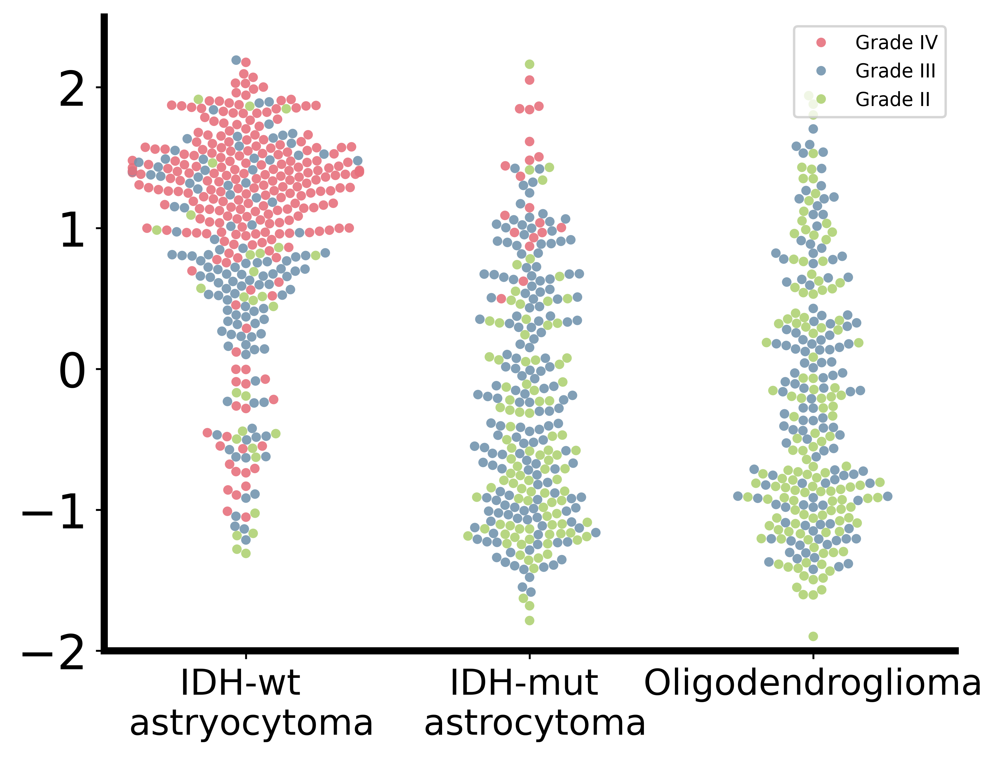

 25%|██▌       | 1/4 [00:07<00:22,  7.60s/it]

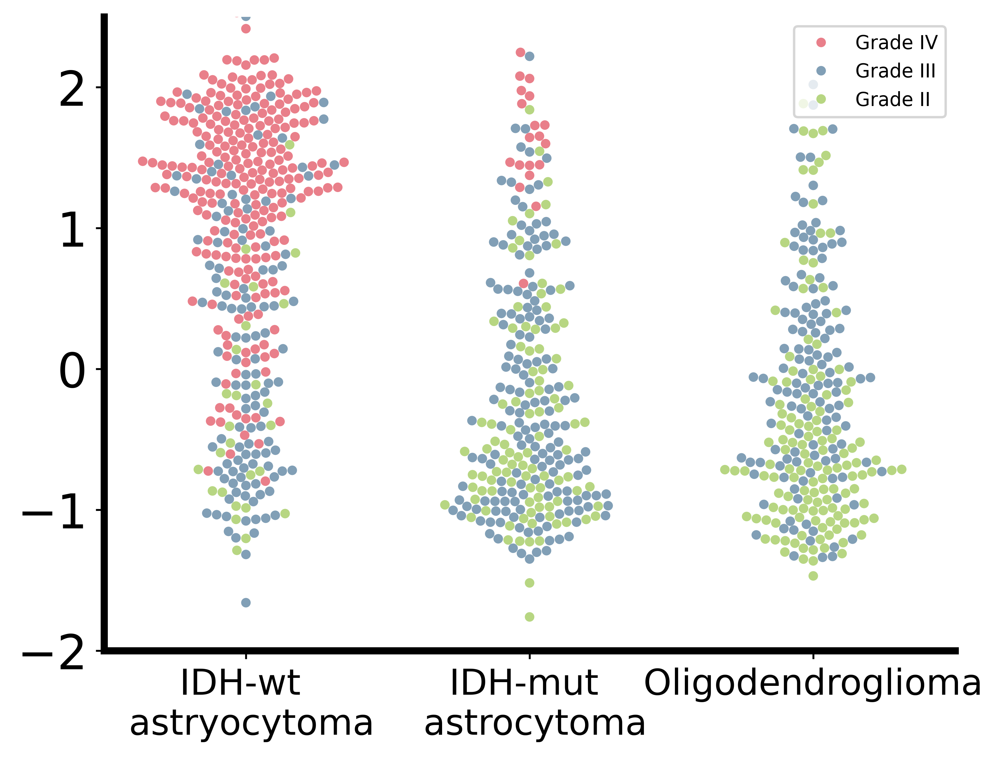

 50%|█████     | 2/4 [00:15<00:15,  7.71s/it]

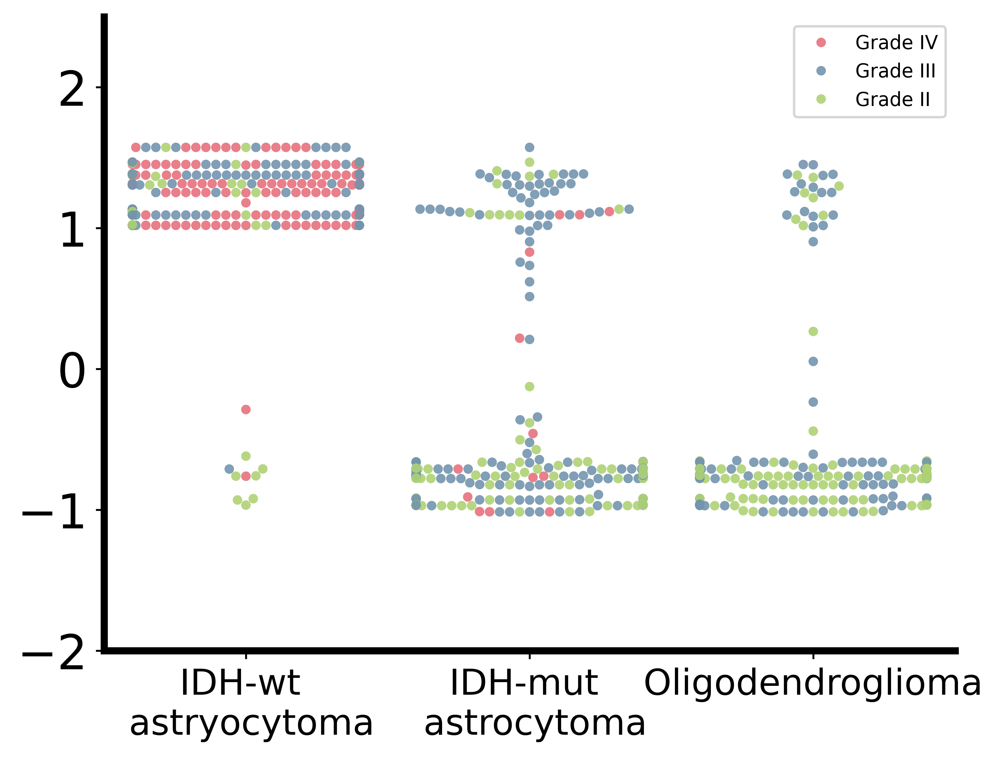

 75%|███████▌  | 3/4 [00:24<00:08,  8.20s/it]

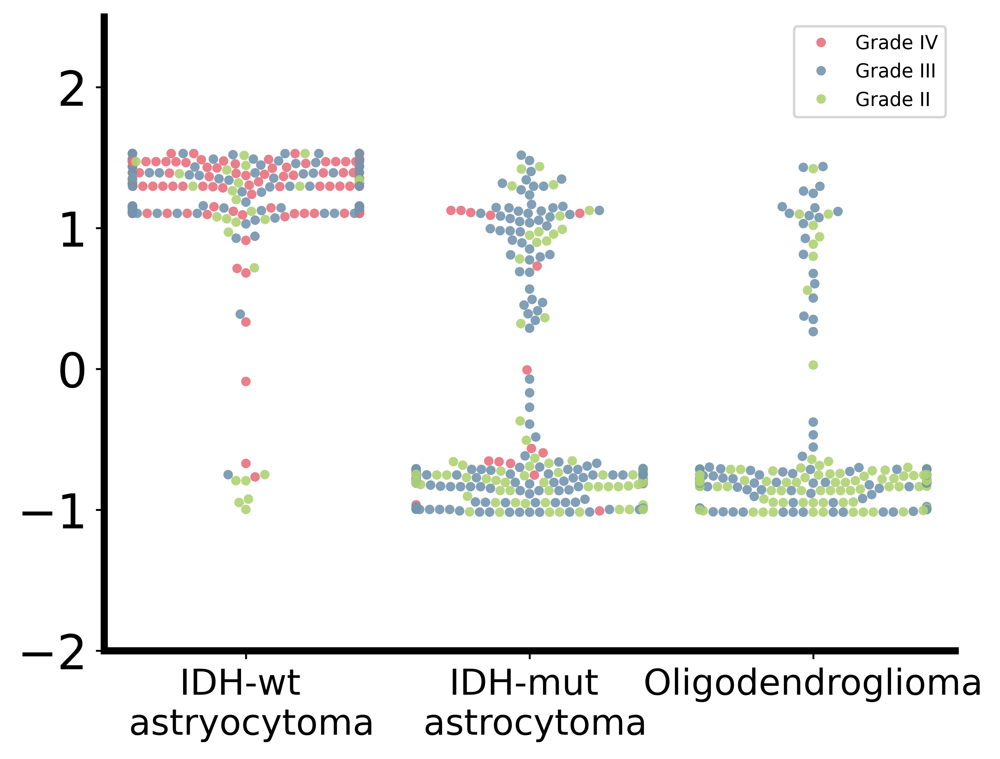

100%|██████████| 4/4 [00:33<00:00,  8.41s/it]


In [16]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
for model in tqdm(["path", "graph", "omic", "pathgraphomic_fusion"]):
    makeHazardBoxPlot(ckpt_name=ckpt_name, model=model)
    makeHazardSwarmPlot(ckpt_name=ckpt_name, model=model)
    makeKaplanMeierPlot(ckpt_name=ckpt_name, model=model)

In [3]:
makeHazardBoxPlot(ckpt_name="./checkpoints/TCGA_GBMLGG/surv_15_paper/", model="path")

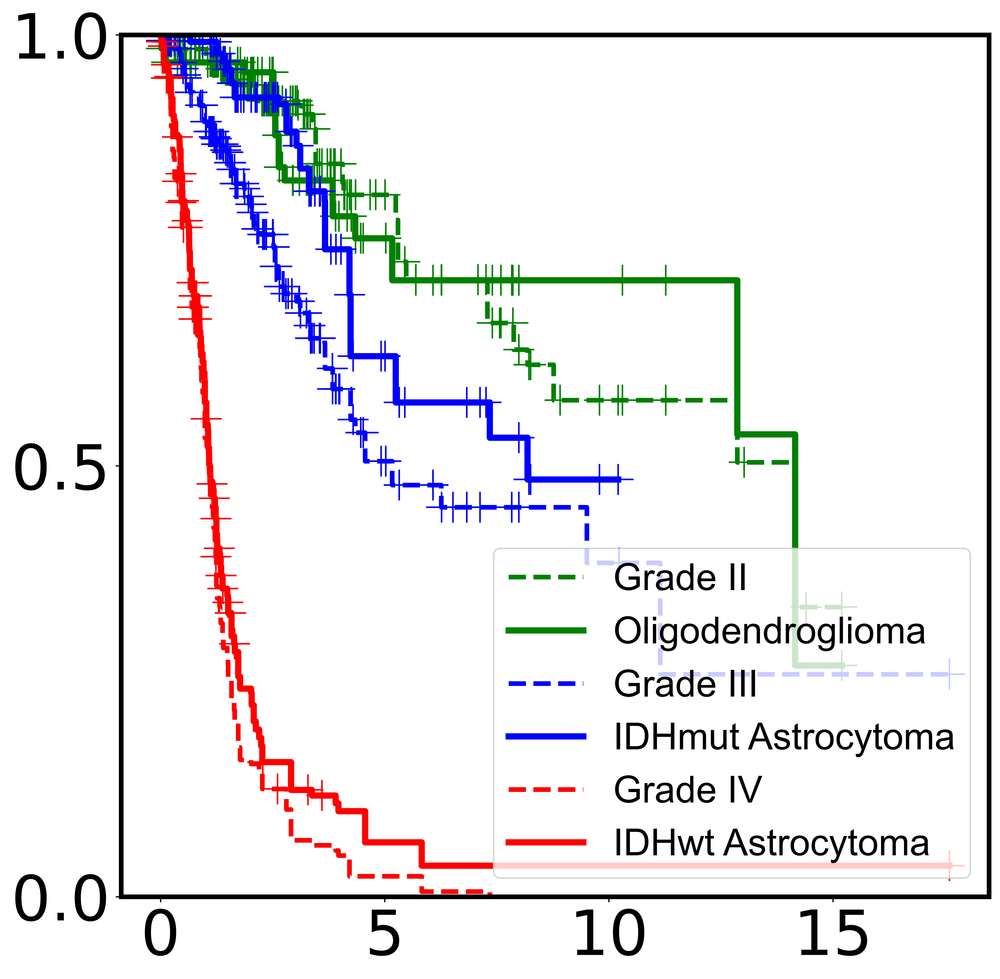

In [17]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
makeKaplanMeierPlot_Baseline(ckpt_name=ckpt_name, model="Histomolecular subtype")

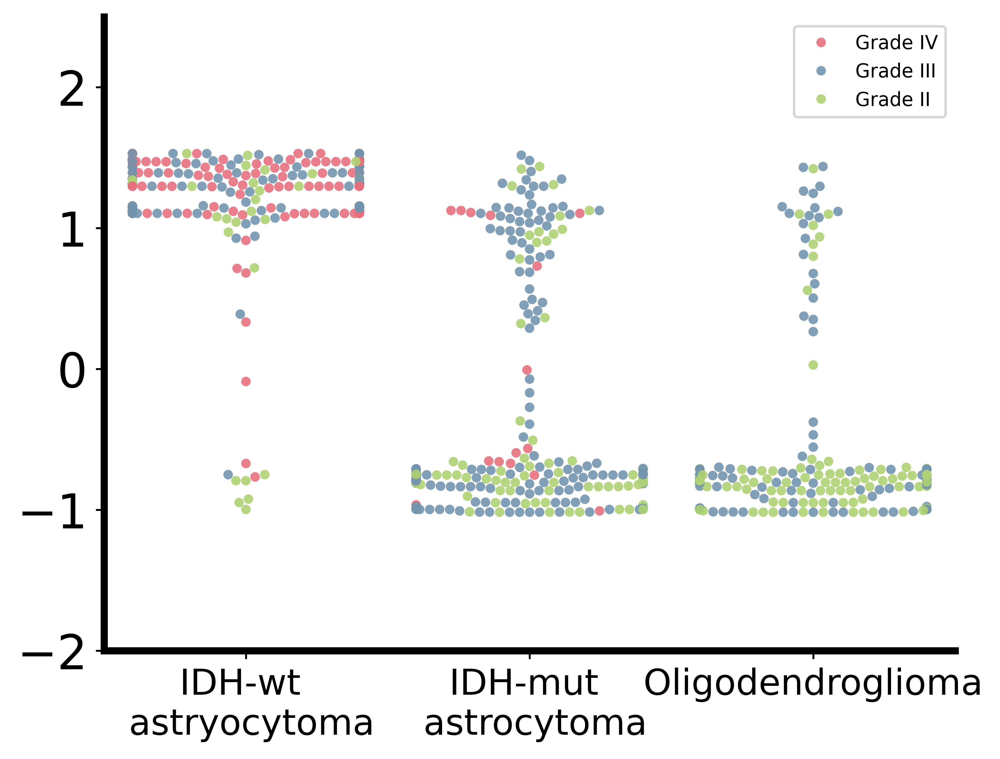

In [2]:
# Hazard swarm plot
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
makeHazardSwarmPlot(ckpt_name=ckpt_name, model="pathgraphomic_fusion")
# split='test', agg_type='Hazard_max')
# agg_type='max')

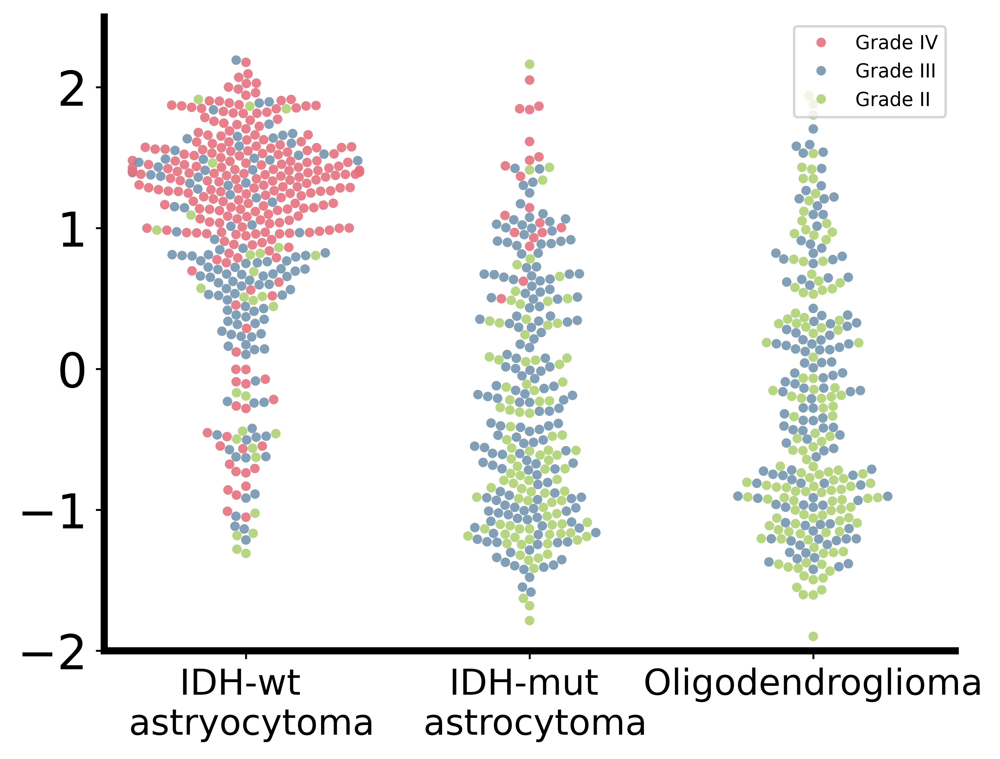

In [3]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
makeHazardSwarmPlot(ckpt_name=ckpt_name, model="path")

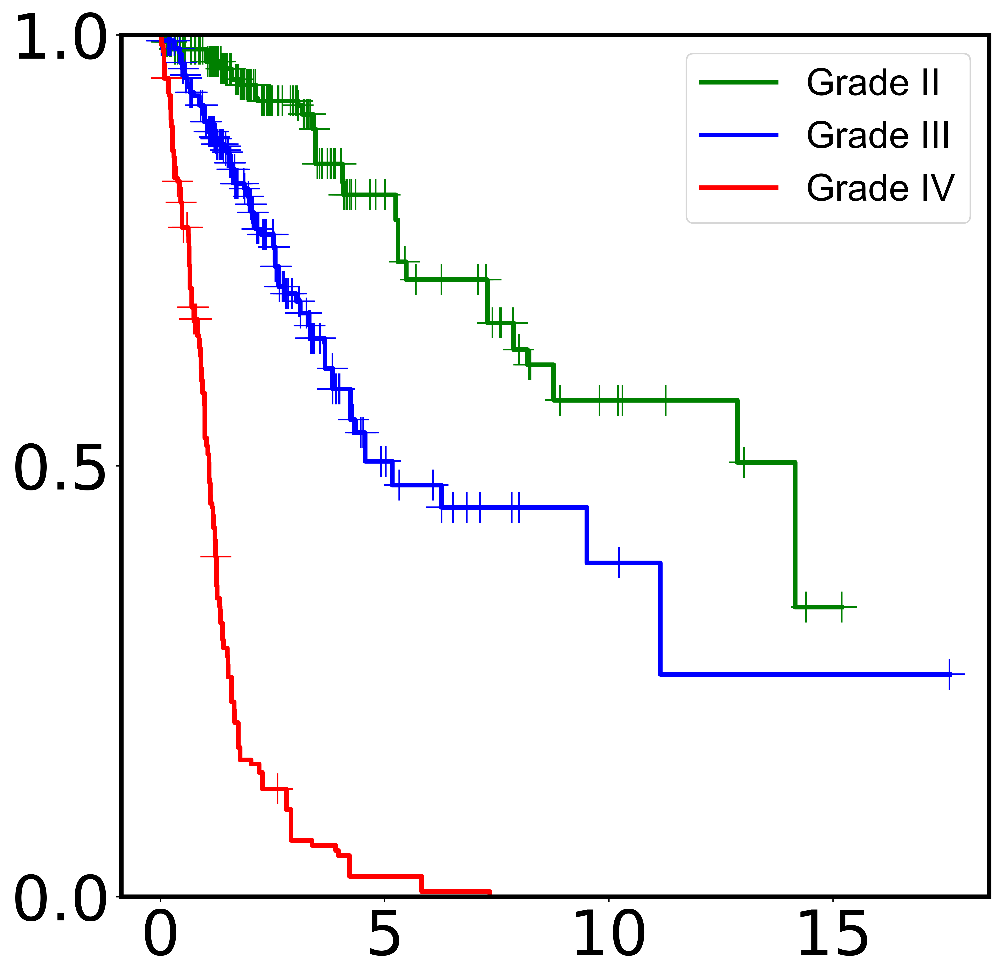

In [18]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
makeKaplanMeierPlot_Baseline_grade(ckpt_name=ckpt_name, model="Histomolecular subtype")

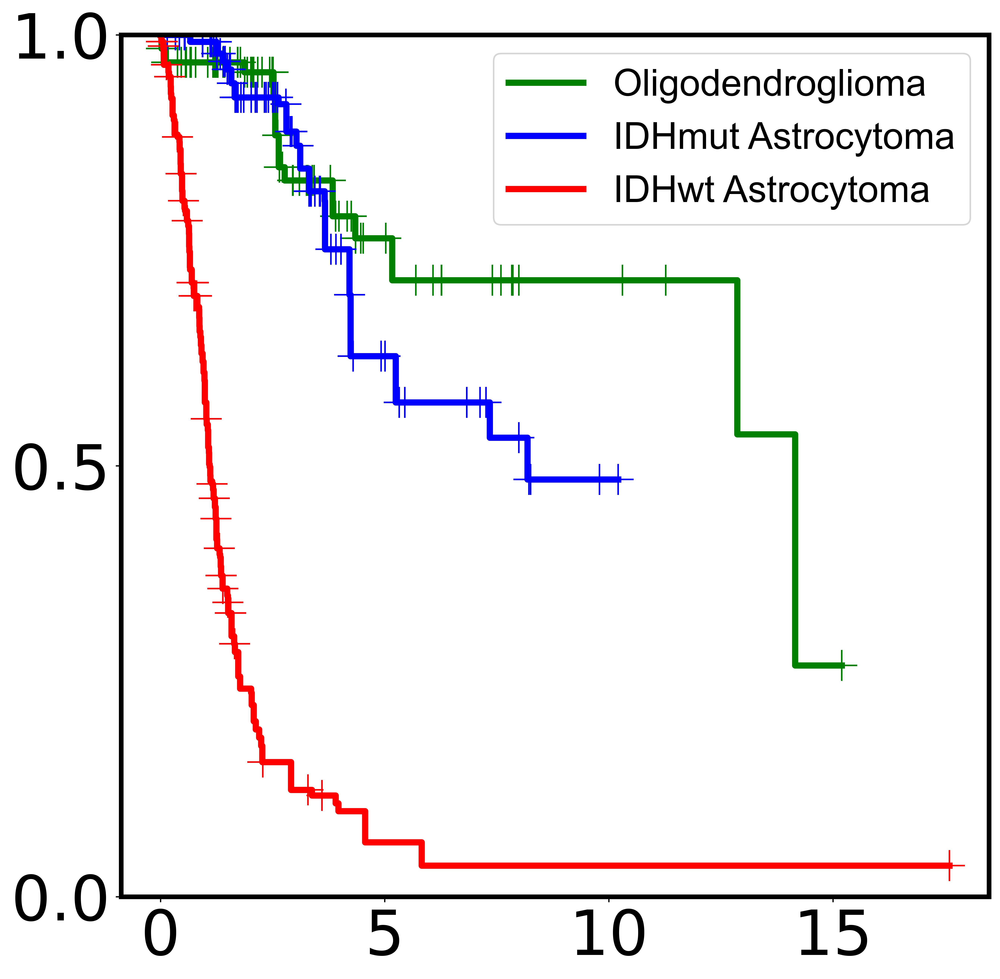

In [19]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
makeKaplanMeierPlot_Baseline_molecular(
    ckpt_name=ckpt_name, model="Histomolecular subtype"
)

In [21]:
ckpt_name = "./checkpoints/TCGA_GBMLGG/surv_15_paper/"
for model in tqdm(["path", "graph", "omic", "pathgraphomic_fusion"]):
    makeKaplanMeierPlot(ckpt_name=ckpt_name, model=model, plot_gt=False)

100%|██████████| 4/4 [00:06<00:00,  1.54s/it]
